## Analisando os voos no Brasil
Disciplina: Análise de Redes

Estudante: Alice Soares Pereira de Barros

##### Antes de começar, vamos executar as células de código abaixo:

In [1]:
!pip install nxviz=='0.6.3'

In [6]:
# import usefull packages
import networkx as nx
import matplotlib.pyplot as plt
import nxviz as nv
import numpy as np

In [ ]:
# download the dataset: GRAPHML 
#!gdown https://github.com/alvarofpp/dataset-flights-brazil/data/air_traffic.graphml

#!gdown https://drive.google.com/uc?id=1wp1ob1h0wszn8niKjV0pJE6BeqxTYGct

...

In [3]:
# download the dataset: CSV (AIRPORT) 
!gdown  https://drive.google.com/uc?id=1u70O6NxMTcgVqYTD8vsIj0msRLDHLDV1

Downloading...
From: https://drive.google.com/uc?id=1u70O6NxMTcgVqYTD8vsIj0msRLDHLDV1
To: /content/airports.csv
100% 87.6k/87.6k [00:00<00:00, 31.6MB/s]


In [4]:
# download the dataset: CSV (ANAC) 
!gdown  https://drive.google.com/uc?id=15Jczl99Oyjp9kP5pYE7xKi59AYFVFxi2

Downloading...
From: https://drive.google.com/uc?id=15Jczl99Oyjp9kP5pYE7xKi59AYFVFxi2
To: /content/anac.csv
100% 252M/252M [00:01<00:00, 131MB/s]


In [44]:
import pandas as pd

df_csv_airport = pd.read_csv("airports.csv")
df_csv_anac = pd.read_csv("anac.csv")

G = nx.Graph()

#Para o gráfico G, por codigo ICAO, usando para a medida de assortatividade
# A partir dessa linha, o código está como foi mostrado em aula pelos colegas Brenda e Paulo
for indice, linha in df_csv_airport.iterrows():
  G.add_node(linha["code"],
             name=linha["name"],
             country=linha["country"],
             latitude=linha["lat_geo_point"],
             longitude=linha["lon_geo_point"],
             region=linha["region"]
             )

edges_df = df_csv_anac[["origin_airport_abbreviation", 
                        "destination_airport_abbreviation",]].dropna()

edges_df = edges_df.groupby(edges_df.columns.tolist(), as_index=False).size()

for indice, linha in edges_df.iterrows():
  if linha["origin_airport_abbreviation"] == linha["destination_airport_abbreviation"]:
    continue
  G.add_edge(linha["origin_airport_abbreviation"], linha["destination_airport_abbreviation"], flight_count = linha["size"])
  
nx.write_graphml(G, "air_traffic.graphml")

In [45]:
G.nodes(data=True)

NodeDataView({'KDFW': {'name': 'DALLAS & FORT WORTH, TEXAS', 'country': 'ESTADOS UNIDOS DA AMÉRICA', 'latitude': '32.896801', 'longitude': '-97.038002', 'region': nan}, 'KJFK': {'name': 'NEW YORK, NEW YORK', 'country': 'ESTADOS UNIDOS DA AMÉRICA', 'latitude': '40.639801', 'longitude': '-73.7789', 'region': nan}, 'KMIA': {'name': 'MIAMI, FLORIDA', 'country': 'ESTADOS UNIDOS DA AMÉRICA', 'latitude': '25.79319953918457', 'longitude': '-80.29060363769531', 'region': nan}, 'SBCF': {'name': 'CONFINS', 'country': 'BRASIL', 'latitude': '-19.62444305419922', 'longitude': '-43.97194290161133', 'region': 'SUDESTE'}, 'SBGL': {'name': 'RIO DE JANEIRO', 'country': 'BRASIL', 'latitude': '-22.8099994659', 'longitude': '-43.2505569458', 'region': 'SUDESTE'}, 'SBGR': {'name': 'GUARULHOS', 'country': 'BRASIL', 'latitude': '-23.435556411743164', 'longitude': '-46.47305679321289', 'region': 'SUDESTE'}, 'SGAS': {'name': 'ASUNCIÓN', 'country': 'PARAGUAI', 'latitude': '-25.239999771118164', 'longitude': '-57.

In [9]:
print("A rede possui {} vértices e {} conexões".format(G.number_of_nodes(),
                                                       G.number_of_edges()))

A rede possui 1083 vértices e 9613 conexões


A rede (total) possui 1083 nodes e 9613 edges

In [10]:
#Testando se há alguma conexão de um nó com ele mesmo
test_self_loop_G = list(nx.selfloop_edges(G))
test_self_loop_G

[]

.

##### 1 - Estudo sobre a Assortatividade da Rede, considerando como atributo a Região onde está localizado o aeroporto.

- Gerar um gráfico similar, considerando a Região do Aeroporto como grupo.

In [46]:
#Para separar apenas os 'codes' do Brasil -> para ficar com apenas os do Brasil
#G_g = nx.Graph()

pais_L = list(G.nodes("country")) #Lista com todos os países e o ICAO respectivo
br_L = []

#selecionando todos os 'code' (ICAO) do Brasil
for cd, ct in pais_L:
  if ct == "BRASIL":
    br_L.append(cd)

In [ ]:
pais_L

In [ ]:
br_L

In [47]:
#configurando os ICAO de cada aeroporto do Brasil
ICAO_ = set(br_L)

icao_dict = {node: (node in ICAO_) for node in G}
nx.set_node_attributes(G, icao_dict, "code")

In [48]:
#gerando um subgrafo com apenas aeroportos do Brasil
sub_g = nx.subgraph(G, ICAO_)

In [49]:
#verificando a representacao dos nodes no subgráfico
sub_g.nodes(data=True)

NodeDataView({'SWPD': {'name': 'BONFIM', 'country': 'BRASIL', 'latitude': '2.7836110591888428', 'longitude': '-60.58777618408203', 'region': 'NORTE', 'code': True}, 'SBGS': {'name': 'PONTA GROSSA', 'country': 'BRASIL', 'latitude': '-25.085599999999943', 'longitude': '-50.178699999999935', 'region': 'SUL', 'code': True}, 'SBMG': {'name': 'MARINGÁ', 'country': 'BRASIL', 'latitude': '-23.47606', 'longitude': '-52.016187', 'region': 'SUL', 'code': True}, 'SWEE': {'name': 'ATALAIA DO NORTE', 'country': 'BRASIL', 'latitude': '-4.52377986908', 'longitude': '-71.560798645', 'region': 'NORTE', 'code': True}, 'SWTU': {'name': 'CAMPO NOVO DO PARECIS', 'country': 'BRASIL', 'latitude': '-13.465528', 'longitude': '-58.866935', 'region': 'CENTRO-OESTE', 'code': True}, 'SNOS': {'name': 'PASSOS', 'country': 'BRASIL', 'latitude': '-20.732200622558594', 'longitude': '-46.661800384521484', 'region': 'SUDESTE', 'code': True}, 'SBUR': {'name': 'UBERABA', 'country': 'BRASIL', 'latitude': '-19.764722824097', 

In [50]:
#quantidade de nodes (vertices) e edges (conexoes) no subgrafico
print("A rede (do subgrafico) possui {} vértices e {} conexões".format(sub_g.number_of_nodes(),
                                                       sub_g.number_of_edges()))


A rede (do subgrafico) possui 495 vértices e 4402 conexões


A rede (subgrafico) do Brasil possui 495 nodes e 4402 edges.

.

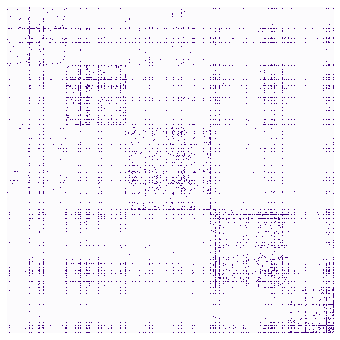

In [51]:
# Criando o objeto da MatrixPlot: rg
rg = nv.MatrixPlot(sub_g, node_color='region',
                   node_order='region')

# Mudando o cmap prior para desenhar.
rg.cmap = plt.cm.get_cmap("Purples")

# Desenhar o objeto rg (region) na tela
rg.draw()

# Mostrando o grafico
plt.show()

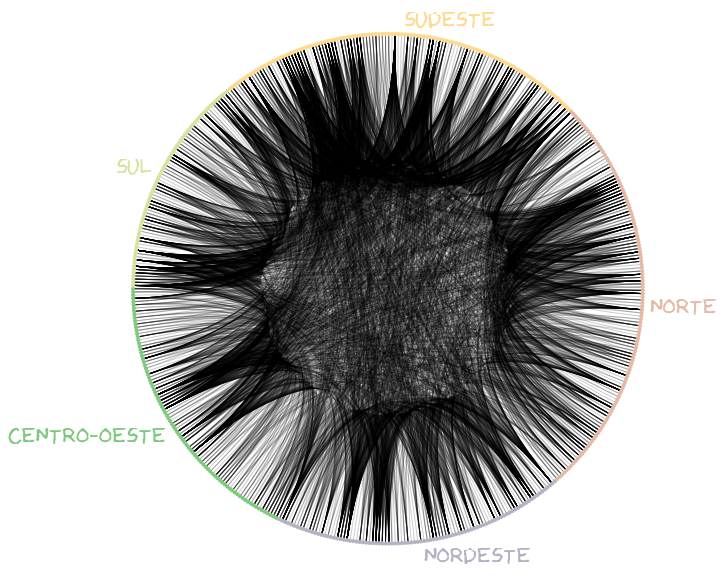

In [83]:
# Importando os modulos necessarios para usar o Circos Plot
from nxviz import CircosPlot 

# Criando o objeto do CircosPlot: c
c = CircosPlot(sub_g, node_color='region', 
               node_grouping='region',
               node_order="region",
               node_labels=False,
               group_label_position="middle",
               group_label_color=True,
               figsize = (10,10),
               nodeprops={"radius": 0.5},
               fontsize=22,
               fontfamily = "fantasy"
               )

# Desenhando o objeto 'c' na tela
c.draw()
c.figure.tight_layout()

# Mostrando o grafico gerado
plt.show()

In [20]:
# Medindo a Assortatividade da rede, baseando no atributo 'region':
nx.attribute_assortativity_coefficient(sub_g,"region")

0.36728130173582774

A assortatividade da rede, considerando o atributo *'region'* é de 0.36728130173582774.

In [21]:
# Mixing Matrix, onde a dimensão dela é proporcional ao numero de regions, 
# que no caso, são 5 linhas e 5 colunas.
m_m = nx.attribute_mixing_matrix(sub_g,'region')
m_m

array([[0.13584734, 0.02078601, 0.02782826, 0.02226261, 0.00726942],
       [0.02078601, 0.07882781, 0.05599727, 0.01067697, 0.01317583],
       [0.02782826, 0.05599727, 0.17446615, 0.03441617, 0.04009541],
       [0.02226261, 0.01067697, 0.03441617, 0.05224898, 0.01226715],
       [0.00726942, 0.01317583, 0.04009541, 0.01226715, 0.06905952]])

In [22]:
#Verificando a soma dos valores da matriz, onde
# deve ser igual a 1.0 para ser uma rede assortativa.

np.sum(m_m)

1.0

.

##### 2 - Realizar uma Análise Bivariada entre o grau do vértice (node degree) e o numero médio de vizinhos (average neighbours)

- Gerar um gráfico similar, considerando a rede do Brasil e de todas as regiões (Norte, Nordeste, Sul, Sudeste e Centro-Oeste)

In [ ]:
# Grau médio de vizinhos do 'sub_g' (apenas Brasil):
grau, med_grau_viz = zip(*nx.average_degree_connectivity(sub_g).items())

# Convertendo para uma lista
grau = list(grau)
med_grau_viz = list(med_grau_viz)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


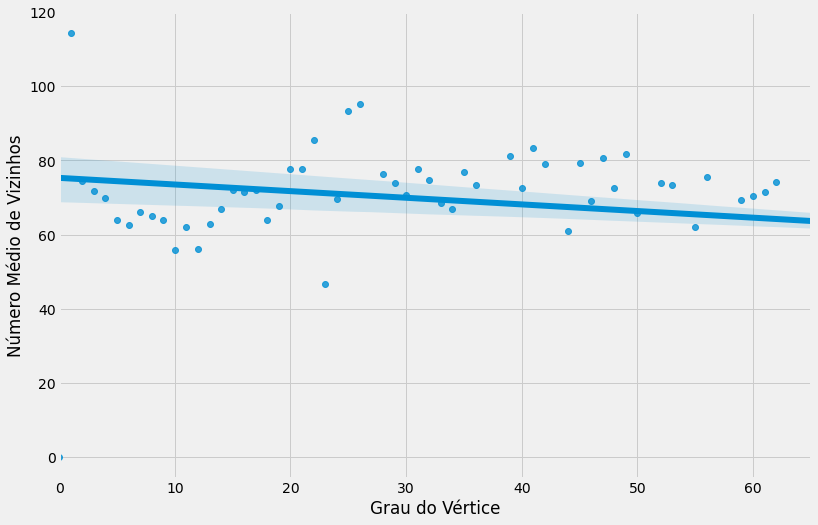

In [ ]:
# Grafico da analise Bivariada entre o 'grau' e o 'med_grau_viz' do Brasil
import seaborn as sns

plt.style.use("fivethirtyeight")
fig, ax = plt.subplots(1,1,figsize=(12,8))

sns.regplot(grau, med_grau_viz, ax=ax)

ax.set_xlabel("Grau do Vértice")
ax.set_ylabel("Número Médio de Vizinhos")
ax.set_xlim(0,65)

# Mostrar o gráfico
plt.show()

In [23]:
# Grau de assortatividade do 'sub_g'
nx.degree_assortativity_coefficient(sub_g)

-0.2017097172979742

.

##### 3 - Quantos Componentes Conectados existem na malha aérea brasileira?

- Caracterizando cada componente por quantidade e porcentagem por região

In [24]:
# Verificando se o 'sub_g' está conectado.
nx.is_connected(sub_g)

False


###### Por Quantidade:

In [ ]:
# Lista de Componentes Conectados no 'sub_g'
list(nx.connected_components(sub_g))

In [62]:
# Laço 'for' na lista de todos os componentes conectados de 'sub_g' 
# e imprimindo a quantidade de componentes conectados:

for component in list(nx.connected_components(sub_g)):
  print(len(component))

491
1
1
1
1


In [128]:
# Laço 'for' na lista de todos os componentes conectados de 'sub_g' 
# e imprime os componentes:

for component in nx.connected_components(sub_g):
  print(component)

{'SWPD', 'SBGS', 'SBMG', 'SWEE', 'SWTU', 'SNOS', 'SBUR', 'SDWQ', 'SNGQ', 'SWGI', 'SBAM', 'SWVR', 'SNPV', 'SNRJ', 'SSGY', 'SBPS', 'SWNK', 'SNQD', 'SNRS', 'SNKK', 'SNPC', 'SWDE', 'SWPI', 'SNJK', 'SNRU', 'SSLT', 'SWKN', 'SSTL', 'SNCB', 'SNMA', 'SWKK', 'SBDN', 'SNGI', 'SNMK', 'SBPI', 'SSRS', 'SBBH', 'SWJU', 'SBLS', 'SBTB', 'SNJM', 'SBIT', 'SBFL', 'SNBA', 'SILC', 'SDVE', 'SDMC', 'SBVC', 'SNJD', 'SBBI', 'SWCD', 'SIKC', 'SWYY', 'SWMP', 'SWXM', 'SWBG', 'SNVC', 'SNQM', 'SBTC', 'SNIU', 'SBCZ', 'SBRJ', 'SNNG', 'SNLA', 'SBCX', 'SWFE', 'SNDR', 'SDZG', 'SNJO', 'SNRB', 'SWJH', 'SBTU', 'SBAR', 'SWYN', 'SBPG', 'SBJI', 'SSNC', 'SSOG', 'SSCP', 'SSEP', 'SWGP', 'SNDM', 'SDBK', 'SWLB', 'SBAG', 'SWII', 'SBCV', 'SNAP', 'SBSV', 'SBSC', 'SBCP', 'SBJV', 'SDUN', 'SWPQ', 'SDTF', 'SNSG', 'SNEB', 'SSNH', 'SBJC', 'SNHS', 'SSDO', 'SBPK', 'SWNQ', 'SSSC', 'SJCW', 'SNWS', 'SSTE', 'SBTD', 'SBJE', 'SDNM', 'SBAS', 'SWSQ', 'SBMY', 'SWKO', 'SBSJ', 'SSUW', 'SWRD', 'SBMT', 'SWNS', 'SBPO', 'SBBV', 'SNMD', 'SNGA', 'SSAC', 'SBPC',

In [64]:
# Quantidade de componentes conectados no subgrafico 'sub_g'
nx.number_connected_components(sub_g)

5

O 'sub_g' tem 5 componentes conectados.

###### Porcentagem por Região:

In [105]:
# Região Norte
l_n = []
for cd, N in sub_g.nodes("region"):
  if N == "NORTE":
    l_n.append(N)

# Região Nordeste
l_ne = []
for cd, NE in sub_g.nodes("region"):
  if NE == "NORDESTE":
    l_ne.append(NE)

# Região Centro-Oeste
l_co = []
for cd, CO in sub_g.nodes("region"):
  if CO == "CENTRO-OESTE":
    l_co.append(CO)

# Região Sudeste
l_SE = []
for cd, SE in sub_g.nodes("region"):
  if SE == "SUDESTE":
    l_SE.append(SE)

# Região Sul
l_S = []
for cd, S in sub_g.nodes("region"):
  if S == "NORTE":
    l_S.append(S)

print ("Brasil: ", sub_g.number_of_nodes(),
       "\nNorte: ", len(l_n),"\nNordeste: ", len(l_ne),
       "\nCentro-Oeste: ", len(l_co),"\nSudeste: ", len(l_SE),
       "\nSul: ", len(l_S))

Brasil:  495 
Norte:  128 
Nordeste:  92 
Centro-Oeste:  89 
Sudeste:  116 
Sul:  128


In [129]:
porc_N = (len(l_n)/sub_g.number_of_nodes())*100
porc_NE = (len(l_ne)/sub_g.number_of_nodes())*100
porc_CO = (len(l_co)/sub_g.number_of_nodes())*100
porc_SE = (len(l_SE)/sub_g.number_of_nodes())*100
porc_S = (len(l_S)/sub_g.number_of_nodes())*100

print("A porcentagem de aeroportos da região Norte é {}%,\n a do Nordeste é {}%,\n a do Centro-Oeste é {}%,\n a do Sudeste é {}%\n e a do Sul é {}%".format(porc_N, 
                                                                                                                                      porc_NE,
                                                                                                                                      porc_CO,
                                                                                                                                      porc_SE,
                                                                                                                                      porc_S))

A porcentagem de aeroportos da região Norte é 25.858585858585858%,
 a do Nordeste é 18.585858585858585%,
 a do Centro-Oeste é 17.97979797979798%,
 a do Sudeste é 23.434343434343436%
 e a do Sul é 25.858585858585858%


Para a região Norte, a porcentagem é de, aproximadamente, 25.86%, para a região Nordeste, a porcentagem é de, aproximadamente, 18,59%, para a região Centro-Oeste, a porcentagem é de, aproximadamente, 17,98%, para a região Sudeste, a porcentagem é de, aproximadamente, 23,44% e, para a região Sul, a porcentagem é de, aproximadamente, 25,86%, 

In [ ]:
"""# Brasil
l_BR = []
for cd, BR in sub_g.nodes("region"):
  if BR == "NORTE" or BR == "NORDESTE" or BR == "CENTRO-OESTE" or BR == "SUDESTE" or BR == "SUL":
    l_BR.append(BR)

#configurando para a região de cada aeroporto do Brasil
REG_l = set(l_BR)

REG_dict = {node: (node in REG_l) for node in sub_g}
nx.set_node_attributes(sub_g, REG_dict, "region")"""

In [149]:
#sub_ncc = nx.subgraph(sub_g, REG_l)
#sub_ncc.nodes(data=True)

###### Mostrando o gráfico sobre componentes conectados:

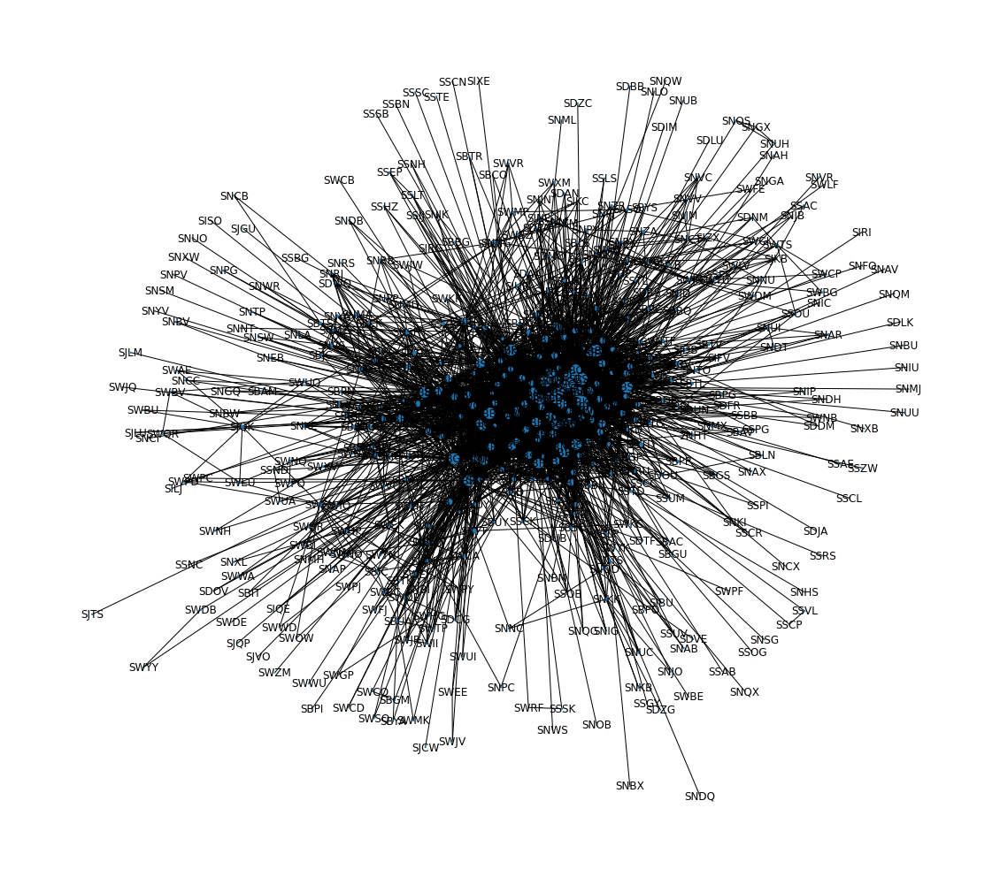

In [36]:
# dica do professor em aula:
# Mostrando em grafico a lista de componentes conectados, salvos no indice 0

fig, ax = plt.subplots(1, 1, figsize=(20,18))
subgraph = nx.subgraph(sub_g, list(nx.connected_components(sub_g))[0])
nx.draw_networkx(subgraph, pos=nx.spring_layout(subgraph),
                 node_size=[value for key, value in nx.degree(subgraph)], 
                 ax = ax)
ax.axis("off")
plt.show()

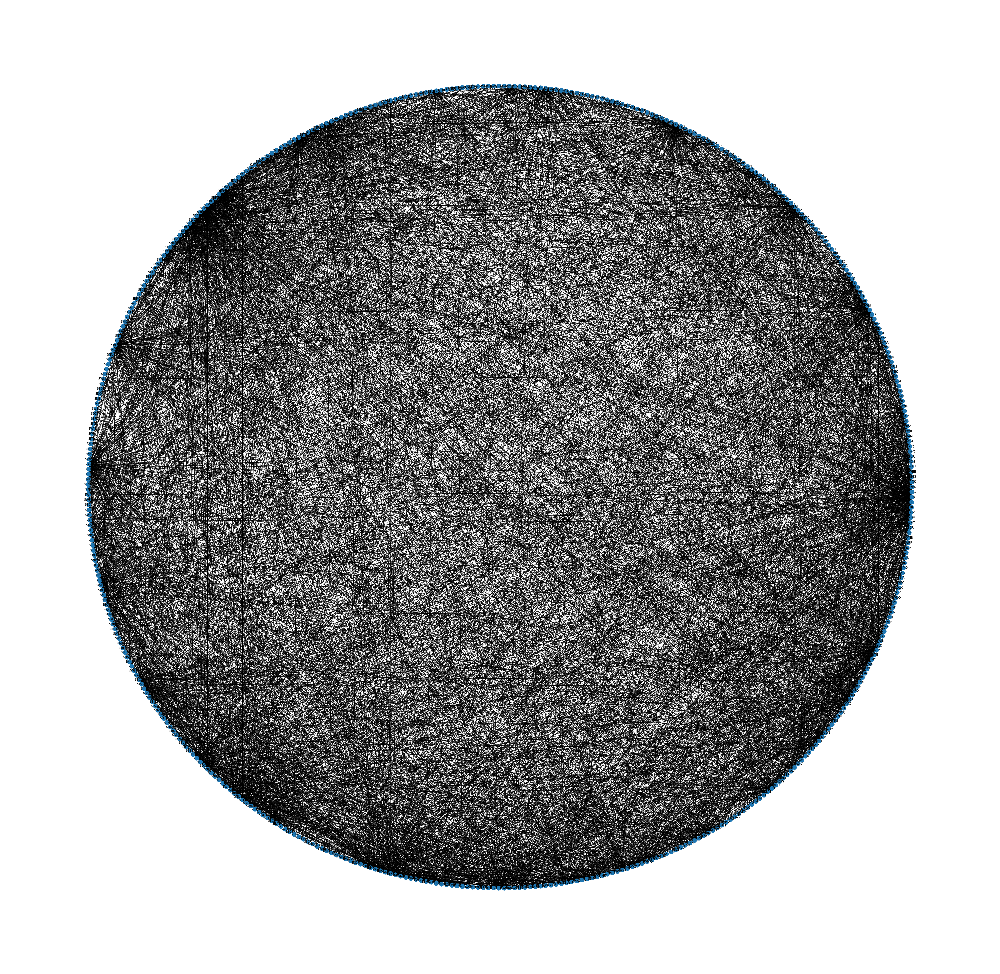

In [37]:
# Mostrando em grafico TODOS os componentes conectados do 'sub_g'

fig, ax = plt.subplots(1, 1, figsize=(70, 70))
nx.draw_networkx(sub_g, pos=nx.circular_layout(sub_g), ax = ax)
ax.axis("off")

plt.show()

.

##### 4 - Criar um cenário simulado, usando o conceito do caminho mais curto, onde se deseja fazer uma viagem, com o seguinte trajeto:

  - Cidade 1 (Norte)  -->  Cidade 2 (Sul)
  - Cidade 2 (Sul)  -->  Cidade 3 (Nordeste)
  - Cidade 3 (Nordeste)  -->  Cidade 4 (Centro-Oeste)
  - Cidade 4 (Centro-Oeste)  -->  Cidade 5 (Sudeste)

In [52]:
# Verificando se o 'sub_g' é um grafico direcionado
sub_g.is_directed()

False

In [42]:
"""#configurando 'region'
REG_NORTE = set(("NORTE"))

regNorte_dict = {node: (node in REG_NORTE) for node in G}
nx.set_node_attributes(G, reg_dict, "regionN")"""

In [53]:
# Dados do 'sub_g'
sub_g.nodes(data=True)

NodeDataView({'SWPD': {'name': 'BONFIM', 'country': 'BRASIL', 'latitude': '2.7836110591888428', 'longitude': '-60.58777618408203', 'region': 'NORTE', 'code': True}, 'SBGS': {'name': 'PONTA GROSSA', 'country': 'BRASIL', 'latitude': '-25.085599999999943', 'longitude': '-50.178699999999935', 'region': 'SUL', 'code': True}, 'SBMG': {'name': 'MARINGÁ', 'country': 'BRASIL', 'latitude': '-23.47606', 'longitude': '-52.016187', 'region': 'SUL', 'code': True}, 'SWEE': {'name': 'ATALAIA DO NORTE', 'country': 'BRASIL', 'latitude': '-4.52377986908', 'longitude': '-71.560798645', 'region': 'NORTE', 'code': True}, 'SWTU': {'name': 'CAMPO NOVO DO PARECIS', 'country': 'BRASIL', 'latitude': '-13.465528', 'longitude': '-58.866935', 'region': 'CENTRO-OESTE', 'code': True}, 'SNOS': {'name': 'PASSOS', 'country': 'BRASIL', 'latitude': '-20.732200622558594', 'longitude': '-46.661800384521484', 'region': 'SUDESTE', 'code': True}, 'SBUR': {'name': 'UBERABA', 'country': 'BRASIL', 'latitude': '-19.764722824097', 

In [ ]:
"""N_S = sub_g.has_edge("NORTE", "SUL")
S_NE = sub_g.has_edge("SUL", "NORDESTE")
NE_CO = sub_g.has_edge("NORDESTE", "CENTRO-OESTE")
CO_SE = sub_g.has_edge("CENTRO-OESTE", "SUDESTE")

print(N_S, " ", S_NE, " ", NE_CO, " ", CO_SE)"""

False   False   False   False


In [ ]:
list(sub_g.nodes("region"))

In [ ]:
for cod, rg in list(sub_g.nodes("region")):
  



In [ ]:
# Mostrando todos os caminhos mais curtos dentro de 'sub_g'
nx.shortest_path(sub_g)

.

##### 5 - Realizar um estudo sobre o Coeficiente de Clustering considerando a Rede da Malha Aérea Nacional, assim como as sub-redes aéreas de cada região.

In [ ]:
nx.triangles(sub_g)

In [ ]:
# Coeficiente de Clustering da 'sub_g' -> rede da malha aérea nacional.
nx.clustering(sub_g)

In [78]:
# Coeficiente de Clustering (para sub-redes aéreas de cada região).

nx.clustering(sub_g, )

{}

In [79]:
nx.average_clustering(sub_g)

0.6230508002369366